<a href="https://colab.research.google.com/github/ajaym416/Naamii/blob/master/mask_detection_t3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 25kB/s 
     |████████████████████████████████| 6.6MB 41.0MB/s 
  Found existing installation: torch 1.5.1+cu101
    Uninstalling torch-1.5.1+cu101:
      Successfully uninstalled torch-1.5.1+cu101
  Found existing installation: torchvision 0.6.1+cu101
    Uninstalling torchvision-0.6.1+cu101:
      Successfully uninstalled torchvision-0.6.1+cu101
     |████████████████████████████████| 276kB 6.9MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=32b6adc19361cae777d566c6eecedba71a7f711e679d3716d645a24d516ebac3
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

In [3]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 682kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=8dcfc5cc3db3d9196df1e42f4f70b79524025c681a7a66e1abd09b71c5a607f4
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore


In [4]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [5]:
!curl -L "https://app.roboflow.ai/ds/o5HrMVONoZ?key=xzE64KWJ8F" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1220      0 --:--:-- --:--:-- --:--:--  1218
100 17.5M  100 17.5M    0     0  10.1M      0  0:00:01  0:00:01 --:--:--  109M
Archive:  roboflow.zip
 extracting: test/maksssksksss440_png.rf.055db5fba823cc1cd8acc7931037fe51.jpg  
 extracting: test/maksssksksss482_png.rf.1f008716eda17686d4a2e3d453c60dd9.jpg  
 extracting: test/maksssksksss786_png.rf.1205cbc39151f28a7a59d5d22d83d8f0.jpg  
 extracting: test/maksssksksss804_png.rf.00188e2f1cf44393d2af5c0bb1839037.jpg  
 extracting: test/maksssksksss336_png.rf.02fb1bb3b7d59d7231d46d60b79b50c3.jpg  
 extracting: test/maksssksksss813_png.rf.16ed3ea9bdfa285f88b53f2a0fae4ff1.jpg  
 extracting: test/maksssksksss710_png.rf.052167e498975ef2b4c4a8f84ceb49b4.jpg  
 extracting: test/maksssksksss675_png.rf.1561b23cd2bebb5f94db3c511bc210b9.jpg  
 extracting: test/mak

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [07/27 14:18:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/27 14:18:21 d2.data.datasets.coco]: Loaded 678 images in COCO format from /content/train/_annotations.coco.json


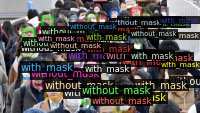

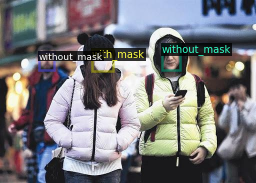

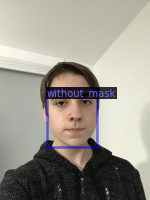

In [7]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [8]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [9]:
# from google.colab import drive
# drive.mount('/content/drive')

In [10]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/27 14:18:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:38, 11.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.


[07/27 14:19:13 d2.engine.train_loop]: Starting training from iteration 0
[07/27 14:19:47 d2.utils.events]:  eta: 0:41:44  iter: 19  total_loss: 2.520  loss_cls: 1.730  loss_box_reg: 0.507  loss_rpn_cls: 0.205  loss_rpn_loc: 0.028  time: 1.6784  data_time: 0.0503  lr: 0.000020  max_mem: 11276M
[07/27 14:20:20 d2.utils.events]:  eta: 0:40:26  iter: 39  total_loss: 2.355  loss_cls: 1.454  loss_box_reg: 0.676  loss_rpn_cls: 0.192  loss_rpn_loc: 0.041  time: 1.6614  data_time: 0.0245  lr: 0.000040  max_mem: 11276M
[07/27 14:20:54 d2.utils.events]:  eta: 0:40:09  iter: 59  total_loss: 1.979  loss_cls: 1.078  loss_box_reg: 0.728  loss_rpn_cls: 0.099  loss_rpn_loc: 0.045  time: 1.6730  data_time: 0.0273  lr: 0.000060  max_mem: 11276M
[07/27 14:21:29 d2.utils.events]:  eta: 0:39:54  iter: 79  total_loss: 1.781  loss_cls: 0.819  loss_box_reg: 0.805  loss_rpn_cls: 0.065  loss_rpn_loc: 0.039  time: 1.6880  data_time: 0.0287  lr: 0.000080  max_mem: 11276M
[07/27 14:22:03 d2.utils.events]:  eta: 0:

In [ ]:
# #from .detectron2.tools.train_net import Trainer
# #from detectron2.engine import DefaultTrainer
# from detectron2.config import get_cfg
# #from detectron2.evaluation.coco_evaluation import COCOEvaluator
# import os

# cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# cfg.DATASETS.TRAIN = ("my_dataset_train",)
# cfg.DATASETS.TEST = ("my_dataset_val",)

# cfg.DATALOADER.NUM_WORKERS = 4
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
# cfg.SOLVER.IMS_PER_BATCH = 4
# cfg.SOLVER.BASE_LR = 0.001


# cfg.SOLVER.WARMUP_ITERS = 1000
# cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
# cfg.SOLVER.STEPS = (1000, 1500)
# cfg.SOLVER.GAMMA = 0.05




# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

# cfg.TEST.EVAL_PERIOD = 500


# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = CocoTrainer(cfg)
# trainer.resume_or_load(resume=False)

# from detectron2.modeling import build_model
# from detectron2.checkpoint import DetectionCheckpointer
# from detectron2.utils.events import EventStorage
# with EventStorage() as storage:
# 	losses = model(dataset_dicts)
# model = build_model(cfg)
# checkpoint_path = "/content/drive/My Drive/checkpoint.pth"
# model.load_state_dict(torch.load(checkpoint_path, map_location='cpu'))
# # model.eval()
# # from detectron2.checkpoint import DetectionCheckpointer
# # DetectionCheckpointer(model).load("/content/drive/My Drive/checkpoint.pth")


# # from detectron2.utils.events import EventStorage
# # with EventStorage() as storage:
# #   losses = model(inputs)
# # inputs = cv2.imread("input.jpg")



# trainer.train()

In [12]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [13]:
# from detectron2.modeling import build_model
# model = build_model(cfg)
# from detectron2.checkpoint import DetectionCheckpointer
# DetectionCheckpointer(model).load("/content/drive/My Drive/checkpoint.pth")  # load a file, usually from cfg.MODEL.WEIGHTS

# checkpointer = DetectionCheckpointer(model, save_dir="output")
# checkpointer.save("model_999")
# model.eval()
# with torch.no_grad():
#   outputs = model(dataset_dicts)

#test evaluation

from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/drive/My Drive/checkpoint.pth")
# cfg.MODEL.WEIGHTS ="/content/drive/My Drive/checkpoint.pth"


cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/27 15:05:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/27 15:05:39 d2.data.datasets.coco]: Loaded 85 images in COCO format from /content/test/_annotations.coco.json
[07/27 15:05:39 d2.data.build]: Distribution of instances among all 4 categories:
|   category   | #instances   |   category    | #instances   |  category  | #instances   |
|:------------:|:-------------|:-------------:|:-------------|:----------:|:-------------|
|     mask     | 0            | mask_weared.. | 17           | with_mask  | 334          |
| without_mask | 68           |               |              |            |              |
|    total     | 419          |               |              |            |              |
[07/27 15:05:39 d2.data.common]: Serializing 85 elements to byte tensors and concatenating them all ...
[07/27 15:05:39 d2.data.common]: Serialized dataset takes 0.03 MiB
[07/27 15:05:39 d2.evaluation.evaluator]

OrderedDict([('bbox',
              {'AP': 0.26996304756904055,
               'AP-mask': nan,
               'AP-mask_weared_incorrect': 0.0,
               'AP-with_mask': 0.8096837279747771,
               'AP-without_mask': 0.00020541473234460375,
               'AP50': 1.0571094331822986,
               'AP75': 0.0136860819102076,
               'APl': 1.1254581157555585,
               'APm': 0.8216711497045688,
               'APs': 0.13066462012695151})])

In [ ]:
%ls ./output/

In [14]:
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

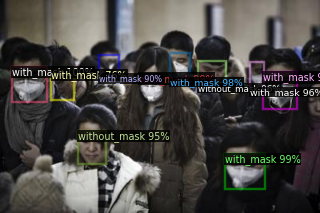

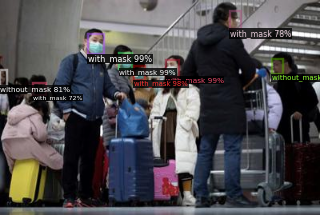

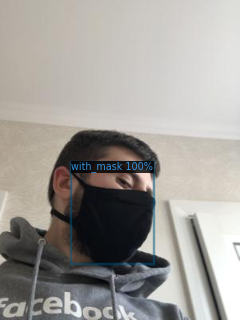

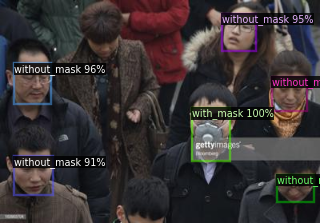

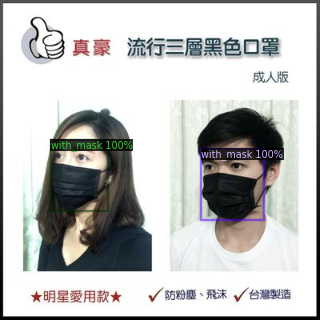

...

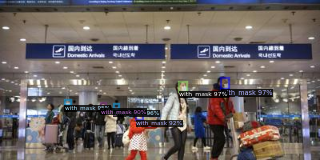

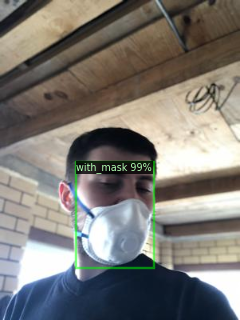

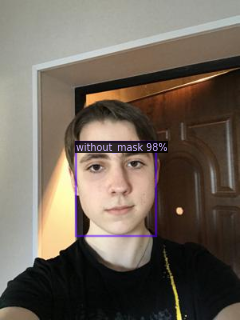

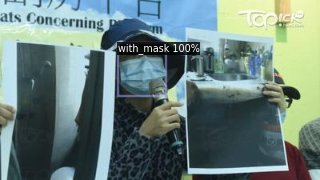

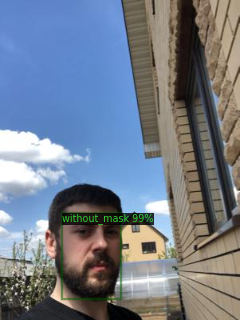

In [15]:
from detectron2.utils.visualizer import ColorMode
import glob
for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# from detectron2.modeling import build_model
# model = build_model(cfg)
# torch.save(model.state_dict(), 'checkpoint.pth')


In [ ]:
# model.load_state_dict(torch.load(checkpoint_path, map_location='cpu'))

